# tSNE visualisation of gene profile clustering

Results of Louvain clustering used on gene expression profiles data and visualised on tSNE embedding. Gene profile is regarded as all measurments across all replicates.

Two types of clusters are presented: 
1. clusters and tSNE on subset of preselected genes with close neighbours - e.g. for extraction of regulons,
2. clusters and tSNE on all genes, which might be latter used for extraction of more general pathways.

### Load data

In [1]:
import os
import sys
from importlib import reload

module_path = os.path.abspath(os.path.join('..'))
if module_path not in sys.path:
    sys.path.insert(0,module_path)

import pandas as pd
import matplotlib.pyplot as plt

from correlation_enrichment.library import SimilarityCalculator
# Reloads module
import library_regulons
reload(library_regulons)
from library_regulons import *

import jupyter_functions as jf
reload(jf)


plt.rcParams["figure.figsize"] = (12,8)

# Because some known warnings display elsehow
import warnings
warnings.filterwarnings('ignore')

In [2]:
dataPath=module_path+'/data_expression/'
genes = pd.read_csv(dataPath + 'mergedGenes_RPKUM.tsv', sep='\t', index_col=0)
conditions = pd.read_csv(dataPath + 'conditions_mergedGenes.tsv', sep='\t', index_col=None)
neighbour_calculator = NeighbourCalculator(genes,conditions=conditions,conditions_names_column='Measurment')

### Obtain genes with close neighbours and prepare data for clustering and tSNE

In order to reduce the number of genes included in regulon calculation and to possibly retain smaller clusters with more similar genes a preselection of genes was made. Genes with at least one very close neighbour (profile cosine similarity above 0.99) were retained. Previous visualisations (graphs) showed that having one close neighbour often means having many close neighbours (e.g. the 'furballs' on graphs).

As genes may have similar profile but different expression range their profiles are preprocessed to remove effects of expression strength in cosine distance/similarity calculation. Each gene profile is preprocessed with log transformation and scaling from 0 to 1. o preprocessed data was used for distance caluations in clustering and tSNE. 

In [3]:
inverse=False # Similar profile (e.g. not similar inversed profile)
threshold=0.99 # Cosine similarity threshold for obtaining genes with at least one close neighbour
neighbours_result = neighbour_calculator.neighbours(n_neighbours=2, inverse=inverse) # 2 neighbours as the closest neighbour is often self
genes_pp,gene_names=Clustering.get_genes(result=neighbours_result, genes=genes, threshold=threshold, 
                                                                    inverse=inverse,return_query=False)
# Preprocessing of data from all genes is done on data from NeigbbouRCalculator, 
# as it remouves genes with all 0 expression
genes_all_pp=NeighbourCalculator.get_index_query(genes=neighbour_calculator._genes,inverse=inverse)[0]
gene_names_all=neighbour_calculator._genes.index

In [4]:
print('All genes:',len(gene_names_all))
print('Selected genes:',len(gene_names))

All genes: 12479
Selected genes: 1967


### tSNE embedding

Below is prepared tSNE embedding for: 1.) all genes and 2.) genes selected for regulon calculation. tSNE is performed on scaled data, as described in 'Obtain genes with close neighbours and prepare data for clustering and tSNE'. Multiscale was used in tSNE to better preserve global structure.

In [5]:
embedding_all=make_tsne(genes_all_pp, perplexities_range= [5, 100], exaggerations = [17, 1.6],
              momentums = [0.6, 0.97])

In [6]:
embedding=make_tsne(genes_pp, perplexities_range= [5, 100], exaggerations = [17, 1.6],
              momentums = [0.6, 0.97])

## tSNE of all genes and genes selected for regulon claculation

The below plot shows tSNE on scaled expression data of all genes. Selected genes (which have at least one very close neighbour and will be used for regulon calculation) are marked with 'selected', others with 'NaN'. 

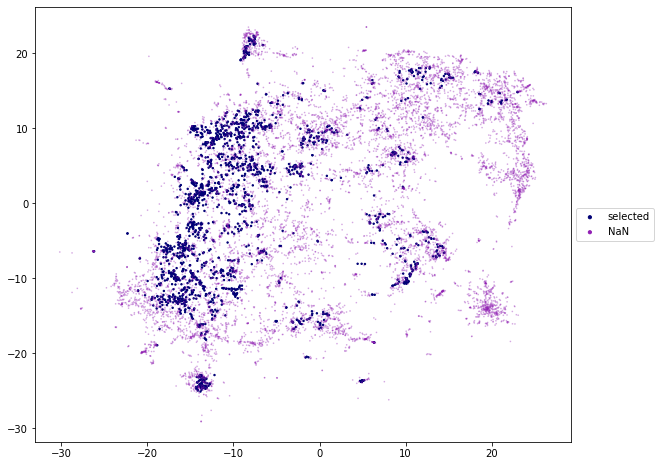

In [24]:
classes=dict(zip(gene_names,['selected']*len(gene_names)))
plot_tsne(embedding_all, classes=classes, names=neighbour_calculator._genes.index, legend=True,
          plotting_params={'selected':{'s':2},'NaN':{'s':0.5,'alpha':0.3}})

There is evident separation of tSNE plot on half with many genes with at least one very close neighbour (e.g. selected) and genes that do not have extremely close neighbours (based on expression pattern). It is possible that this could be explained by the following: When selected genes were previously compared with clusters of differentially expressed genes (DE, for each mutant strain against AX4 in individual time points) most of them were located in clusters that did not show DE or showed DE pattern through time that indicated expression before differentiation (shown below). It is possible that selected genes contain more housekeeping genes (expressed regardless of differentiation, e.g. ribosomal genes, etc.) which are more tightly regulated, thus having more close neighbours. Alternatively, it is possible that they are genes expressed in all strains, thus reducing the chance that they would have low expression profile sections in some strains, which could be more inclined to random variation (both due to biological and technical reasons). However, this would require further testing.

Clusters of DE genes (showing DE genes in mutant strains in time points (top) compared to genes in AX4 (bottom)):
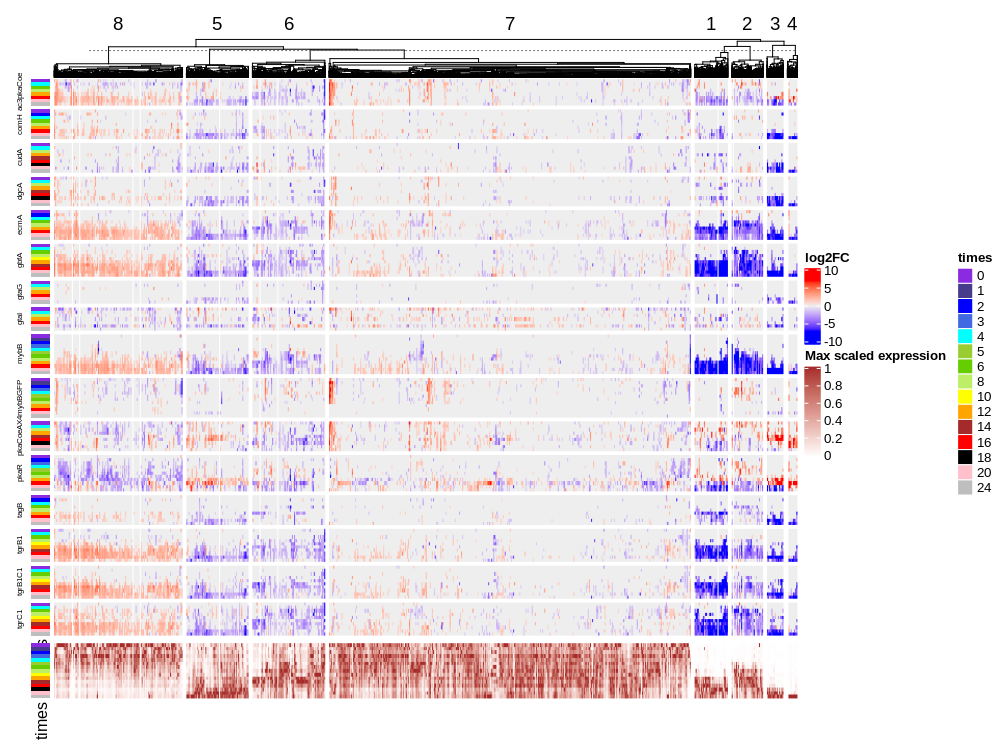
Cluster memebership distribution for all genes:
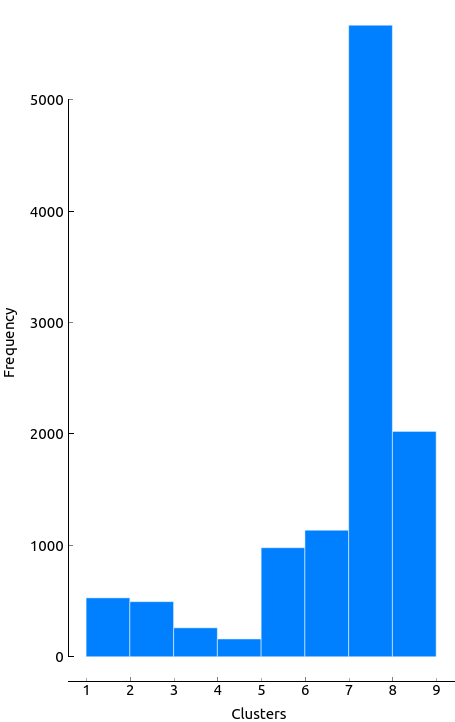
Cluster membership dictribution for selected genes:
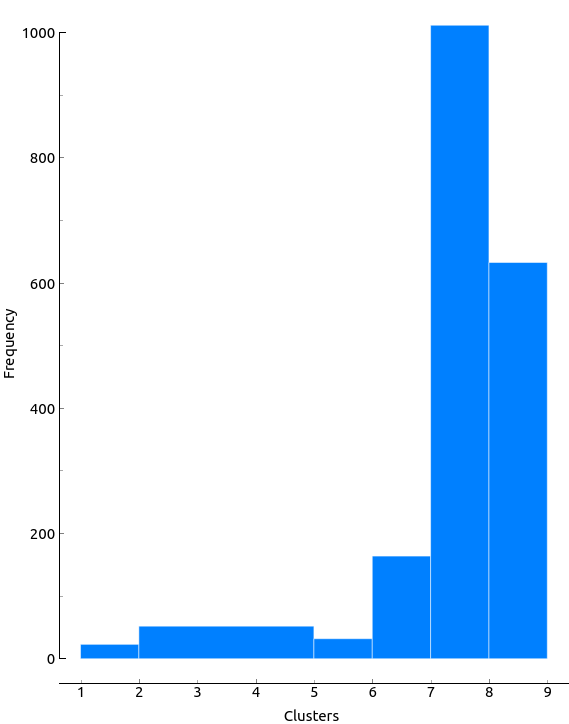

## tSNE visualisations for Louvain clustering

Louvain clustering finds tightly connected parts of a graph. Graph was constructed by using graph construction from Orange, with genes as nodes and similarities between genes as edge weights.  N closest neighbours (genes with most similar profile) are computed for each node and edge weight is based on the number of shared neighbours between nodes (Jaccard index).

In [8]:
# For analysis of clustering results
cluster_analyser=ClusterAnalyser(genes=genes, conditions=conditions, organism=44689, average_data_by='Time',
                 split_data_by='Strain', matching='Measurment',control='AX4')
tsne_data_selected=make_tsne_data(tsne=embedding, names=gene_names)
tsne_data_all=make_tsne_data(tsne=embedding_all, names=gene_names_all)
#tsne_data_all=make_tsne_data(tsne=embedding_all, names=neighbour_calculator._genes.index)
clustering_analyser=ClusteringAnalyser(gene_names=genes.index,cluster_analyser=cluster_analyser)


### Results of Louvain clustering on selected gene subset

These clusters/parts of them can be used for extraction of regulons.

The below visualisations show clustering on tSNE, summary table of cluster sizes (N of genes) and GO enrichment (FDR below 0.25), and visualisation of gene profiles across clusters (rows, cluster number is at the left of the leftmost graph in each row) and strains (columns). Gene profiles have time on x axis and log10 prepocessed expression on y axis (with added pseudocount due to 0 expression in some points: log10(expression+1)). Grey lines show profiles of individual genes, black line is their median.

In [9]:
# Clustering on selected genes
louvain_selected=LouvainClustering.from_orange_graph(data=genes_pp,gene_names=gene_names,neighbours=50)

In [10]:
clusters_selected=louvain_selected.get_clusters(resolution=0.8,random_state=0)

cluster,size,enriched FDR
0,81,cell wall: 3.995E-03cell differentiation: 7.449E-03anatomical structure development: 7.449E-03
1,232,
2,360,
3,249,
4,81,
5,360,mitochondrion: 1.657E-08generation of precursor metabolites and energy: 1.402E-03protein folding: 2.137E-01unfolded protein binding: 2.462E-01
6,83,ribosome biogenesis: 7.194E-23nucleolus: 3.799E-20RNA binding: 1.501E-05nucleus: 3.559E-05helicase activity: 2.638E-02rRNA binding: 1.596E-01methyltransferase activity: 1.596E-01
7,188,ribosome: 3.143E-70structural constituent of ribosome: 6.006E-66structural molecule activity: 3.757E-62translation: 4.842E-54protein-containing complex: 1.698E-24biosynthetic process: 1.483E-21cytoplasm: 1.193E-17RNA binding: 1.198E-09rRNA binding: 1.323E-06cell: 3.456E-05cytosol: 1.275E-01
8,59,cytoskeletal protein binding: 1.319E-10cytoskeleton: 9.676E-10cytoskeleton organization: 1.181E-07protein-containing complex assembly: 7.144E-06cytosol: 3.187E-03cytoplasmic vesicle: 3.187E-03vesicle-mediated transport: 2.363E-02locomotion: 2.533E-02plasma membrane: 4.556E-02membrane organization: 1.063E-01cell morphogenesis: 1.500E-01mitotic cell cycle: 1.729E-01cell motility: 1.976E-01protein-containing complex: 1.976E-01cell cycle: 2.342E-01
9,52,


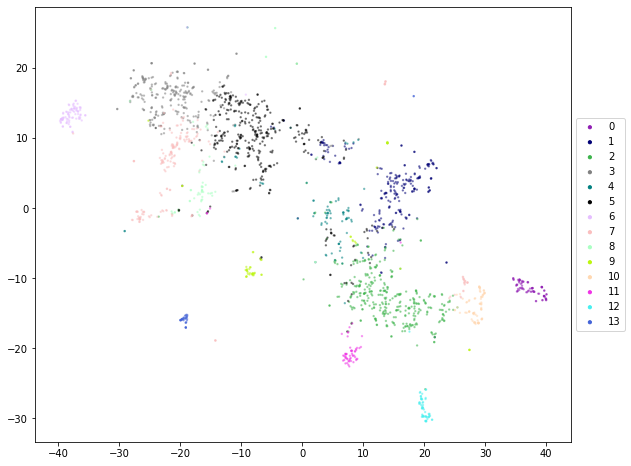

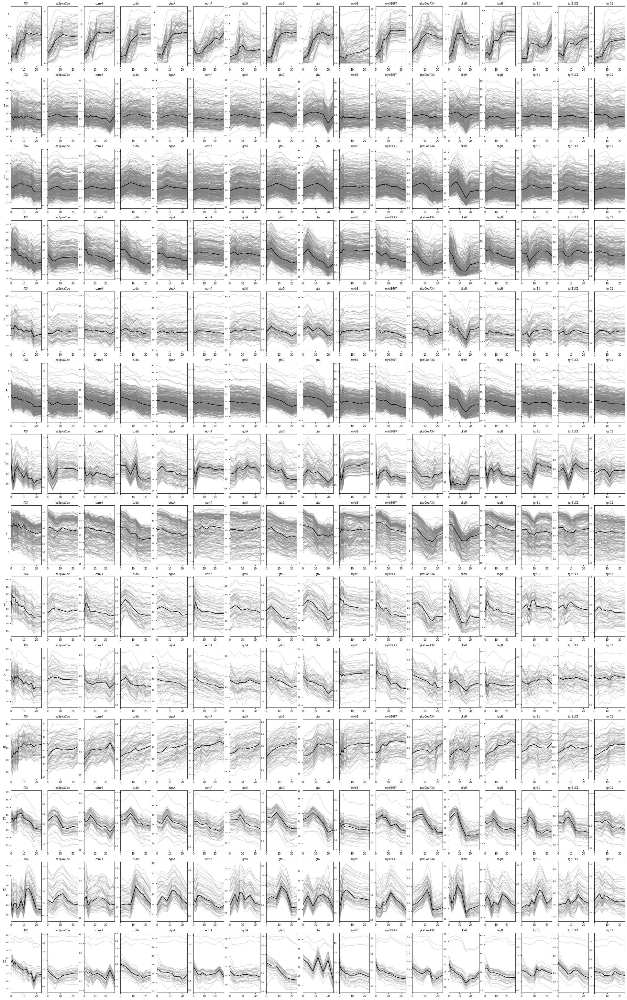

In [25]:
cluster_data_selected,membership_selected=clustering_analyser.analyse_clustering(clustering=louvain_selected,
                                                             clusters=clusters_selected,
                                                       tsne_data=tsne_data_selected,tsne_plot={'s':2,'alpha':0.4})
jf.display_newline_df(cluster_data_selected)

It seems that in general the clusters have genes with similar profiles, but furter selection of smaller groups in Orange would be beneficial for determination of regulons. 

### Results of Louvain clustering on all genes

This could be latter used for determination of broader pathways, as described below. As clusters potentially contain relatively dissimilar gene profiles this visualisation is not apropriate for extraction of regulons.

In [12]:
# Clustering on all genes
louvain_all=LouvainClustering.from_orange_graph(data=genes_all_pp,gene_names=gene_names_all,neighbours=60)

In [13]:
clusters_all=louvain_all.get_clusters(resolution=1,random_state=0)

cluster,size,enriched FDR
0,1286,
1,655,
2,462,
3,778,cell wall: 1.294E-01extracellular matrix organization: 1.801E-01
4,1669,
5,1893,
6,128,
7,1090,mitochondrion: 6.409E-03
8,1203,
9,2042,


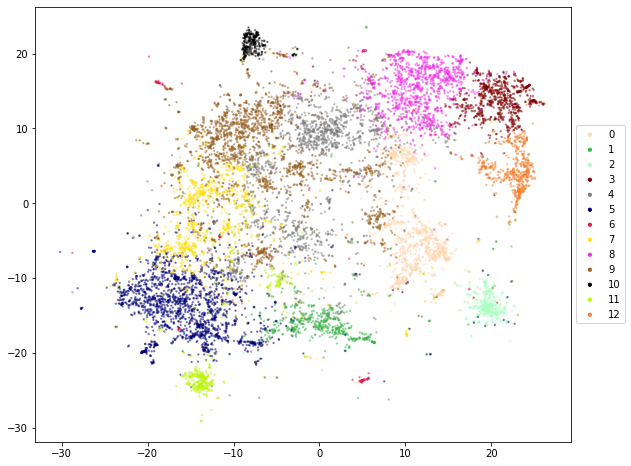

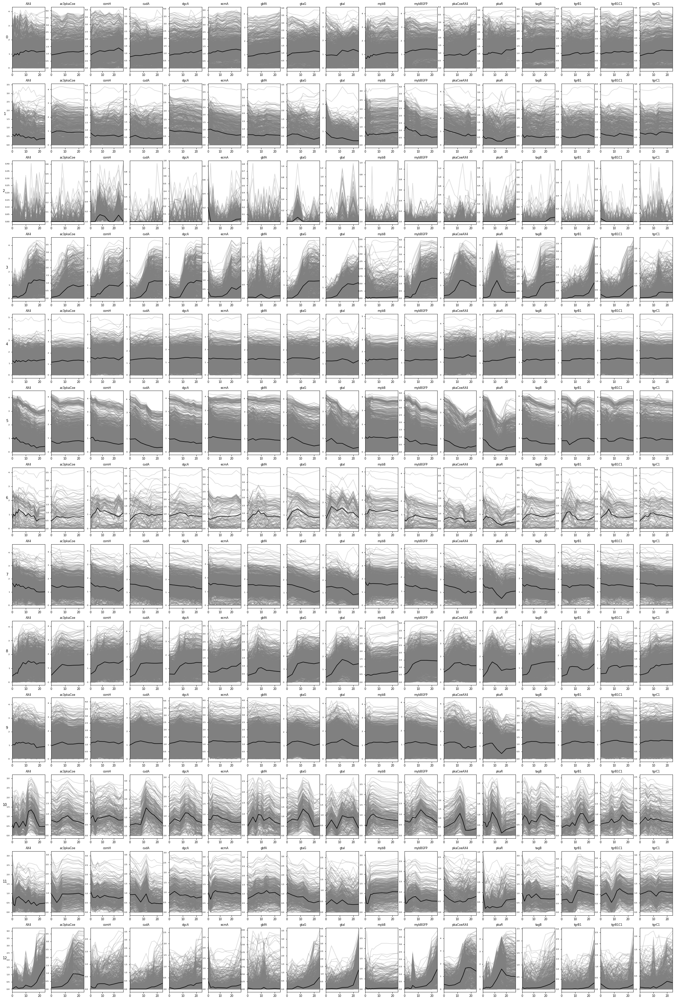

In [26]:
cluster_data_all,membership_all=clustering_analyser.analyse_clustering(clustering=louvain_all,
                                                        clusters=clusters_all,
                                               tsne_data=tsne_data_all,tsne_plot={'s':2,'alpha':0.4})
jf.display_newline_df(cluster_data_all)

In [15]:
louvain_all.save_clusters('clusters_all.tsv',clusters=clusters_all)

This creates clusters somewhat similar to those observed in DE expression heatmap, although there are evident differences. The below image shows how clusters from Louvain clustering on all genes (as shown above) correspond to clusters from DE expression (below marked as stacks, the DE clustering image is shown above). Most Louvain clusters somewhat overlap with the largest cluster '7' from DE clustering. However, there are also groups that contain predominately genes expressed at the end of differentiation (DE groups 1-5). The clusters that stand out then most in tSNE (2,10,11) have predominately genes from DE clusters 7,6, and 8, respectively. DE clusters 7 and 8 contain genes that aren not DE in mutants compared to AX4 or are expressed before/at the beginning of differentiation. This indicates that they may be important housekeeping genes with coregulated profiles. Indeed, cluster 10 is enriched in structural and DNA binding proteins and cluster 11 in transcription/translation related proteins and contains many genes with highly similar expression pattern (e.g. 'selected' genes). Interestingly, cluster 2 contains no 'selected' genes - meaning it has no very tightly coregulated genes. Furthermore, it is comprised almost entirely of hypothetical proteins (412 hypothetical and 24 pseudogenes out of 458 annotated). Thus cluster 2 may be an unexplored pathway, possibly not included in  housekeeping metabolism. Alternatively, it may be a only set of unexpressed genes, as many of them have low expression. 
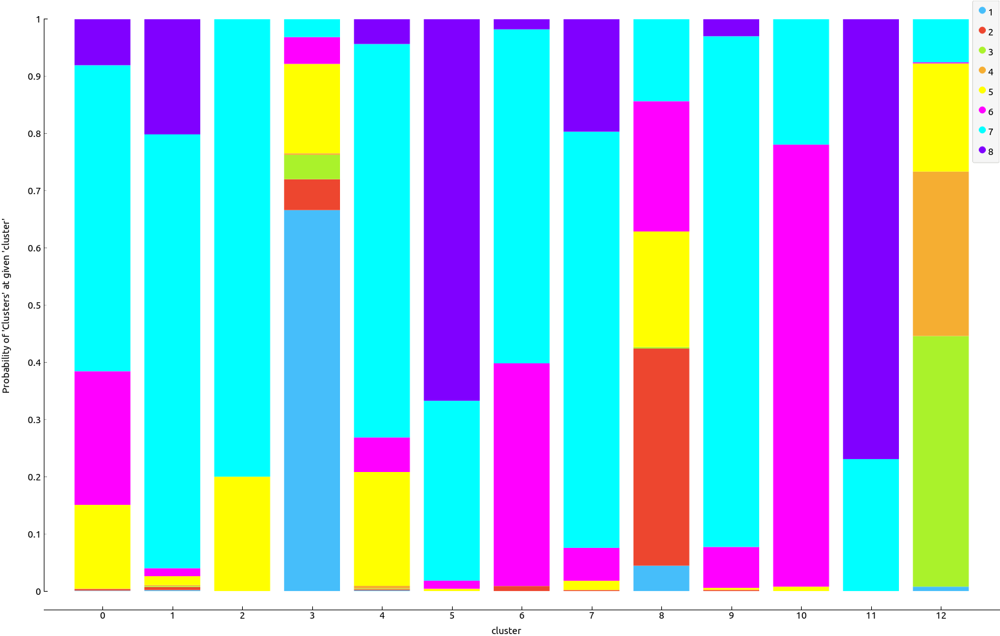

# Conclusion

For discovery of regulons containing tightly coregulated genes preselection of genes with close neighbours would  be beneficial. For general dicovery of new pathways clustering of all genes could be performed (one example would be the cluster 2 in clustering perfomed on  all genes, as discussed above).